/usr/bin/pip:6: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import load_entry_point
{'uci_id': 2, 'name': 'Adult', 'repository_url': 'https://archive.ics.uci.edu/dataset/2/adult', 'data_url': 'https://archive.ics.uci.edu/static/public/2/data.csv', 'abstract': 'Predict whether annual income of an individual exceeds $50K/yr based on census data. Also known as "Census Income" dataset. ', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 48842, 'num_features': 14, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Income', 'Education Level', 'Other', 'Race', 'Sex'], 'target_col': ['income'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1996, 'last_updated': 'Tue Sep 24 2024', 'dataset_doi': '10.24432/C5XW20', 'creators': ['Barry Becker', 'Ronny Kohavi'], 'i

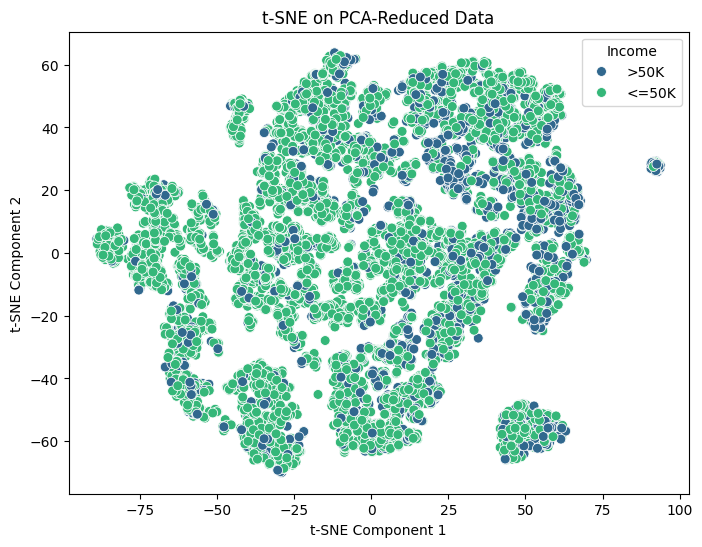

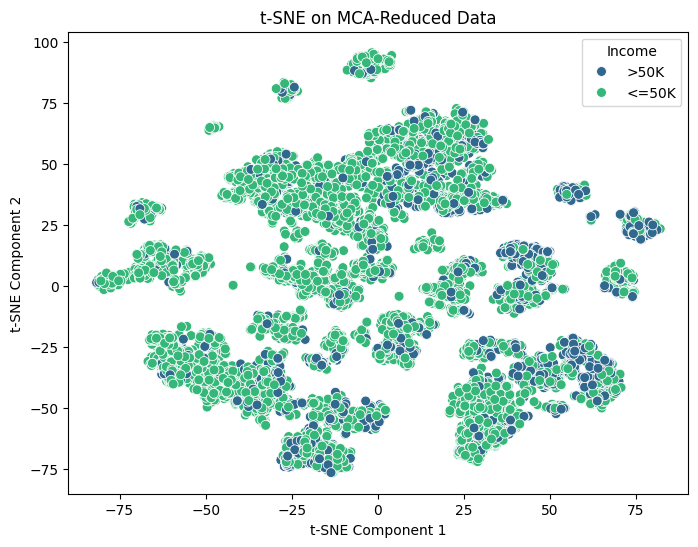

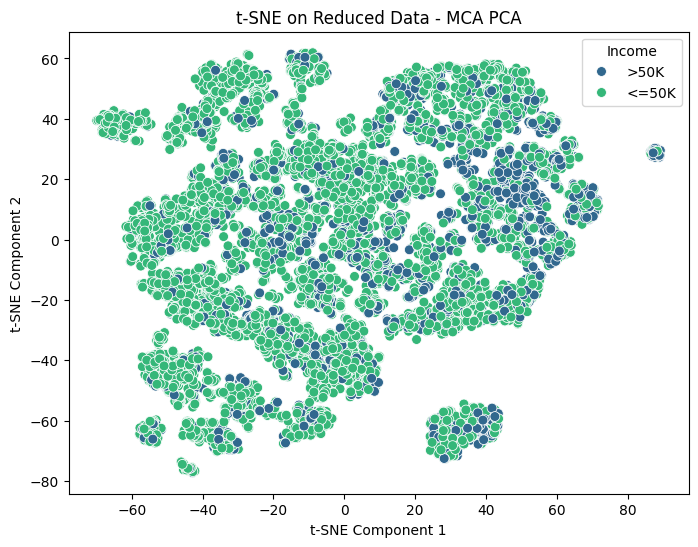

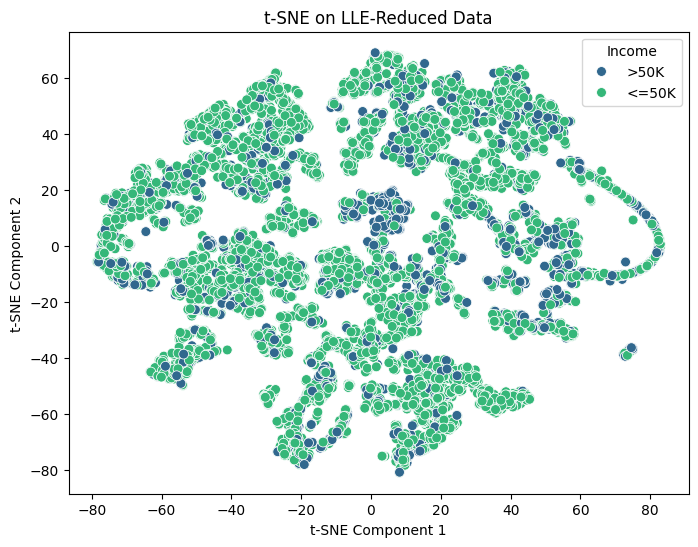

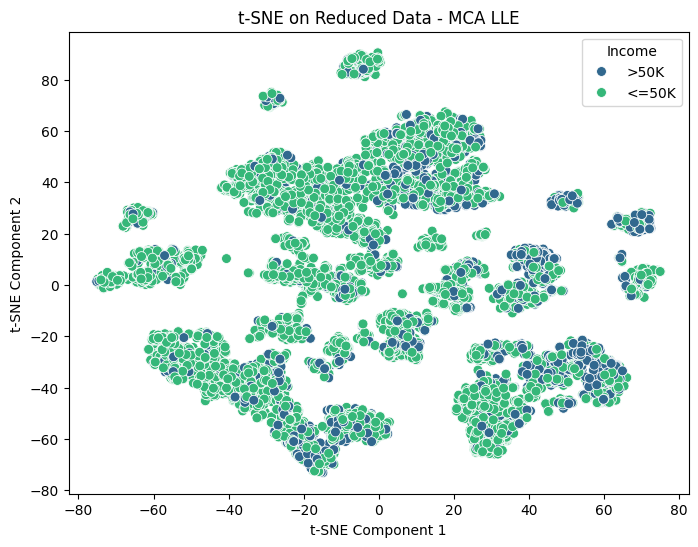

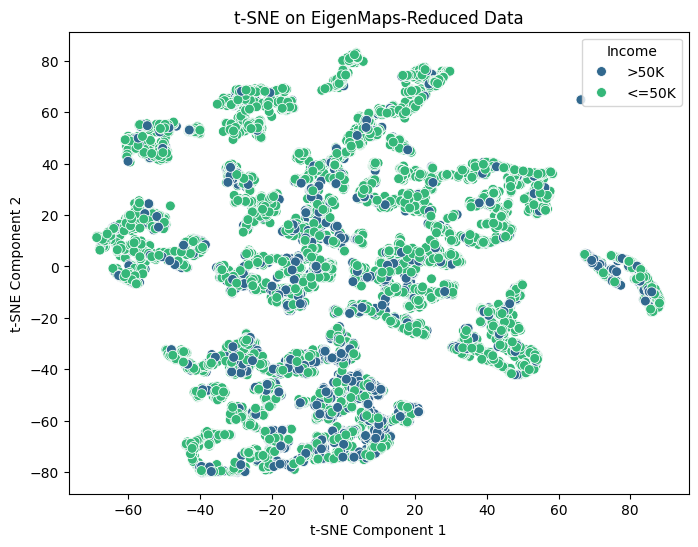

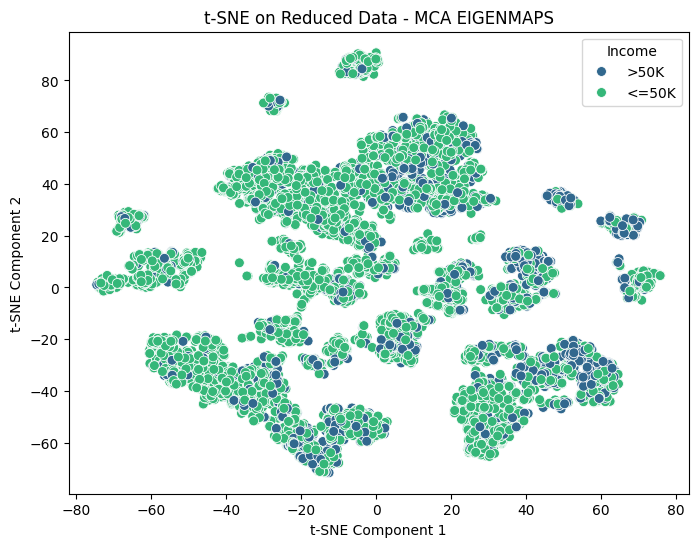

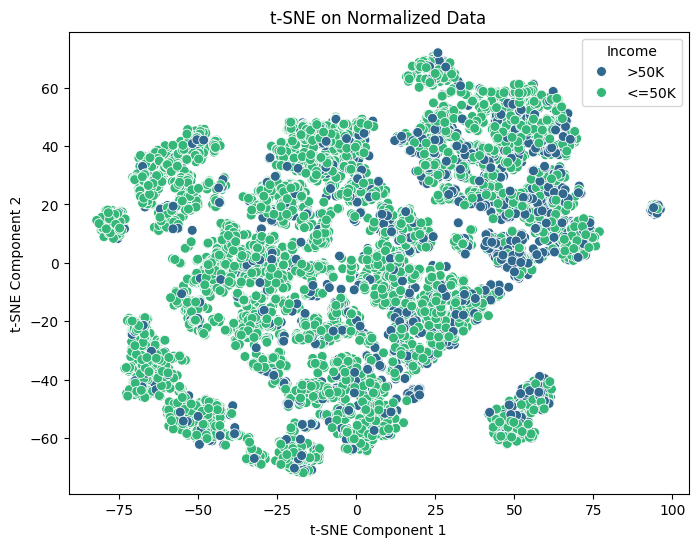

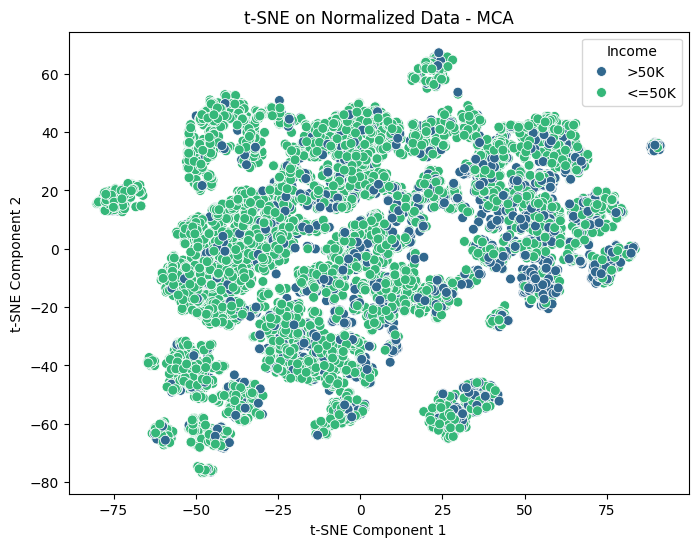

3 has the best K-Means Silhouette Score: 0.54
2 has the best GMM Silhouette Score: 0.22
DBSCAN Silhouette Score: -0.51
HDBSCAN Silhouette Score: 0.76
2 has the best Spectral Silhouette Score: 0.76
3 has the best CMeans Score: 0.17


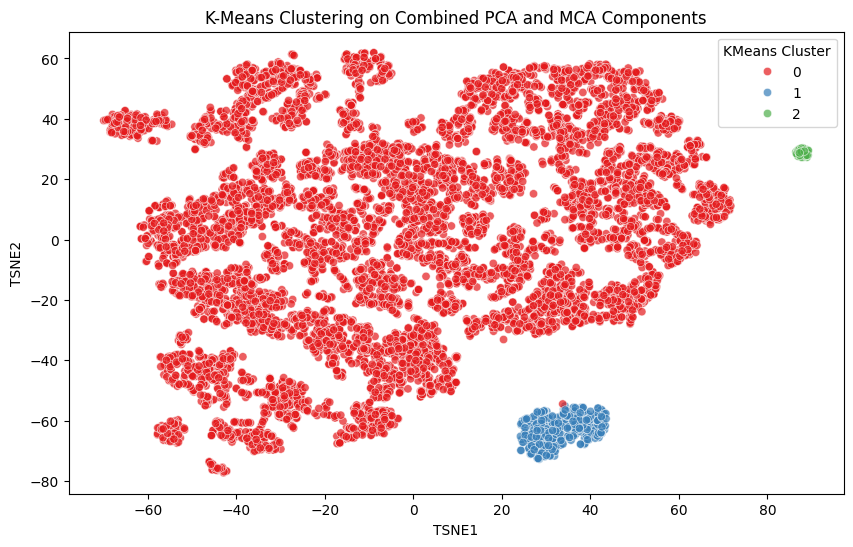

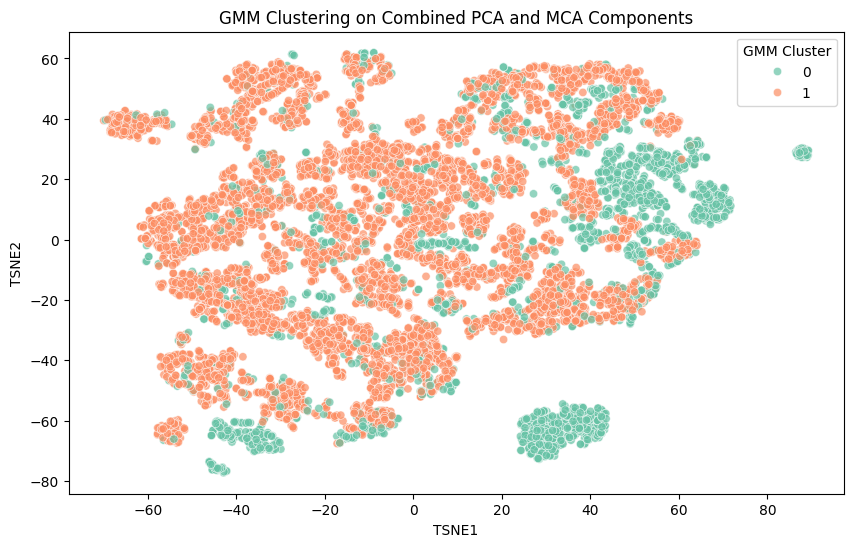

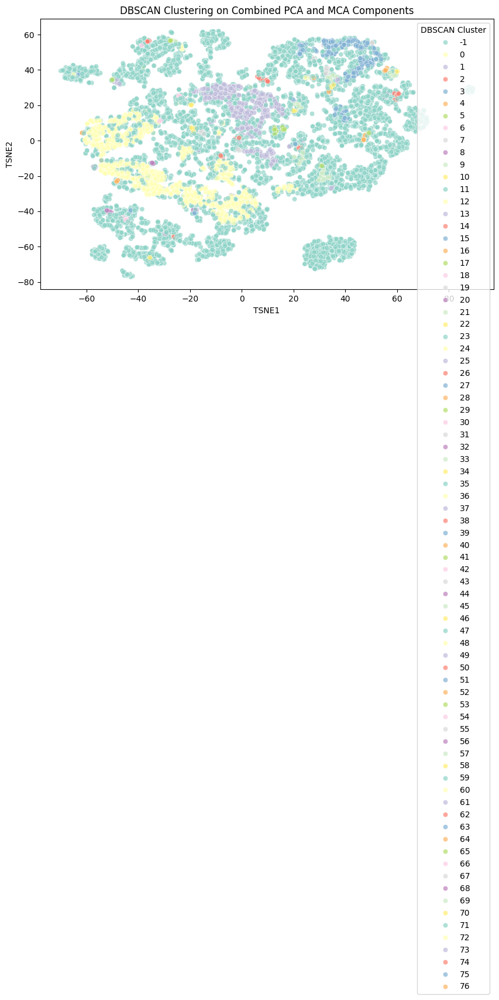

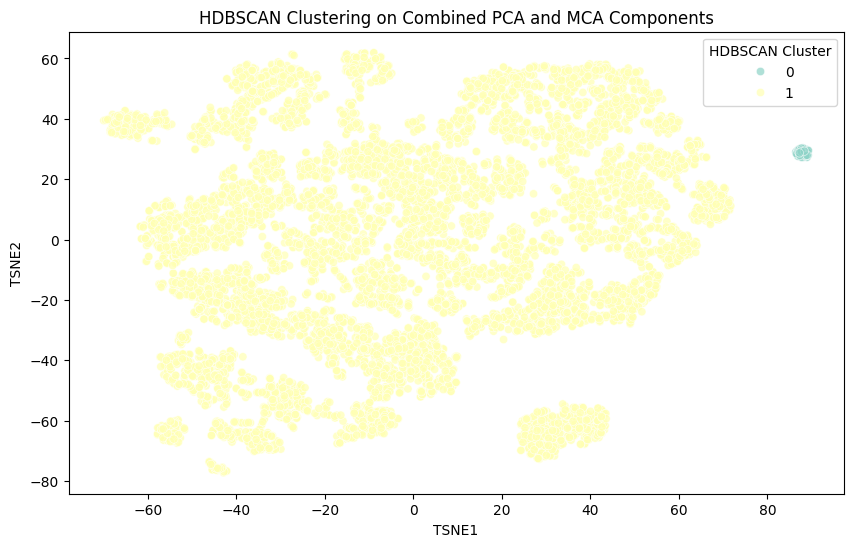

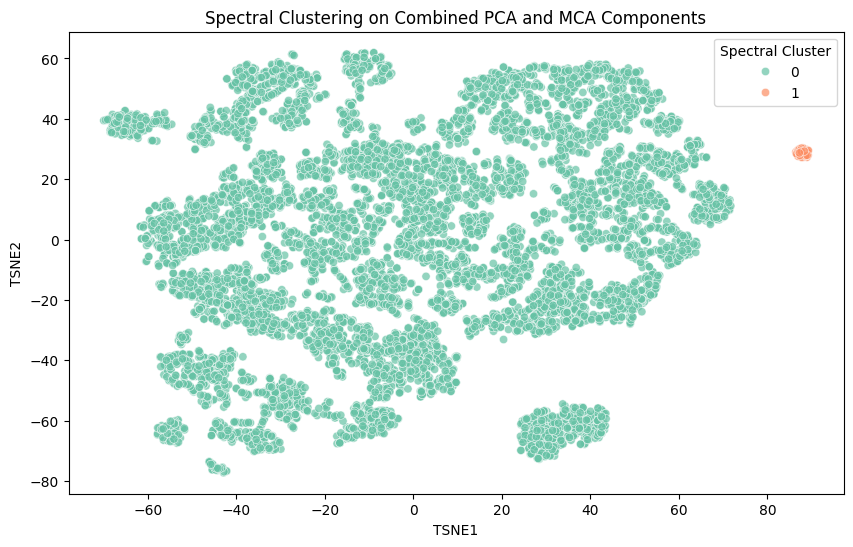

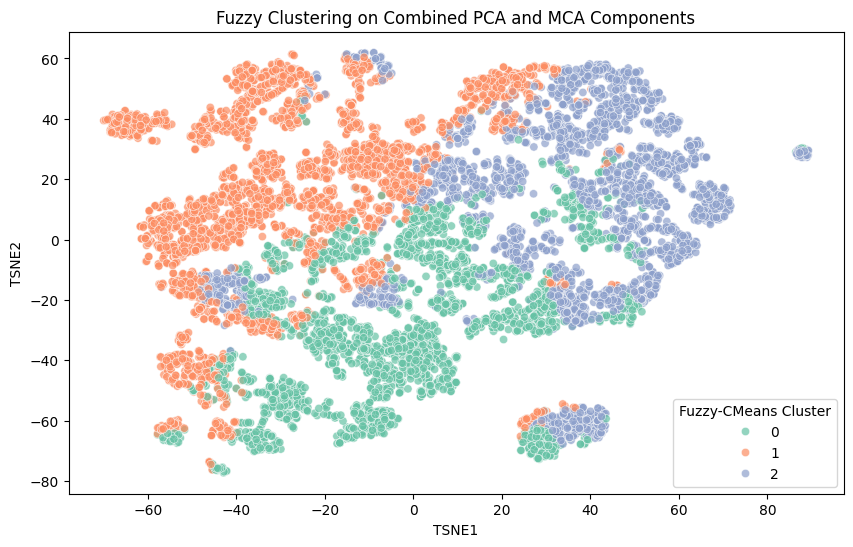

10 has the best K-Means Silhouette Score: 0.32
2 has the best GMM Silhouette Score: 0.24
DBSCAN Silhouette Score: 0.24
HDBSCAN Silhouette Score: 0.00
3 has the best Spectral Silhouette Score: 0.39
3 has the best CMeans Score: 0.17


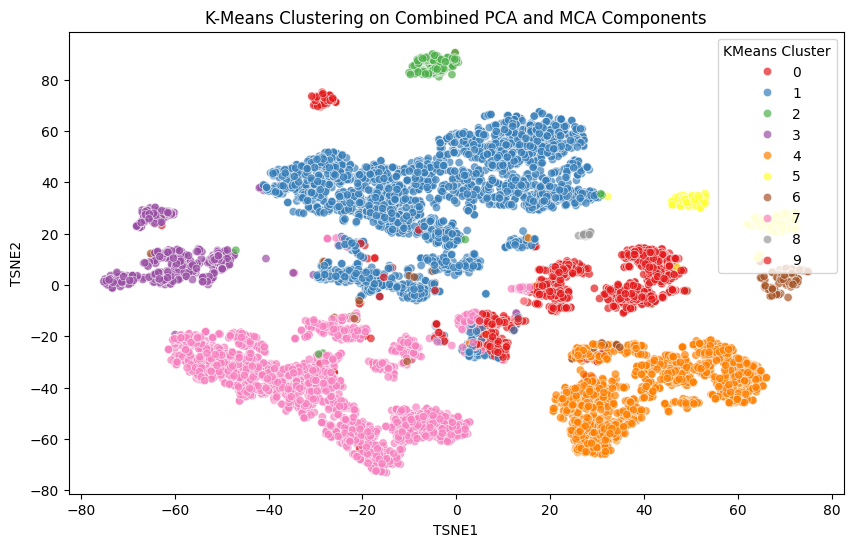

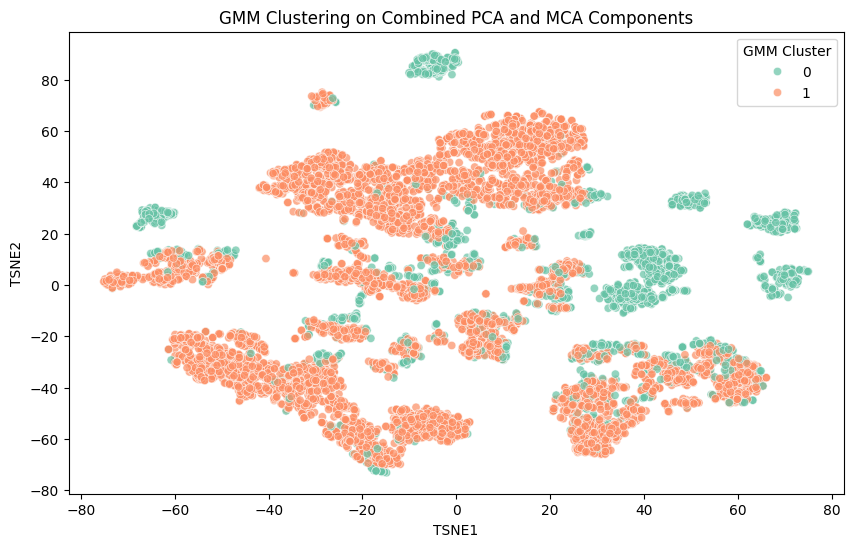

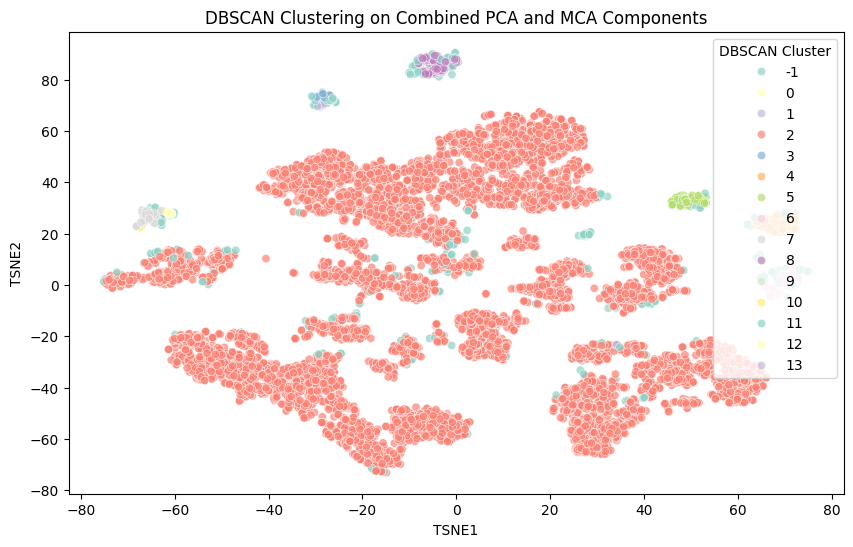

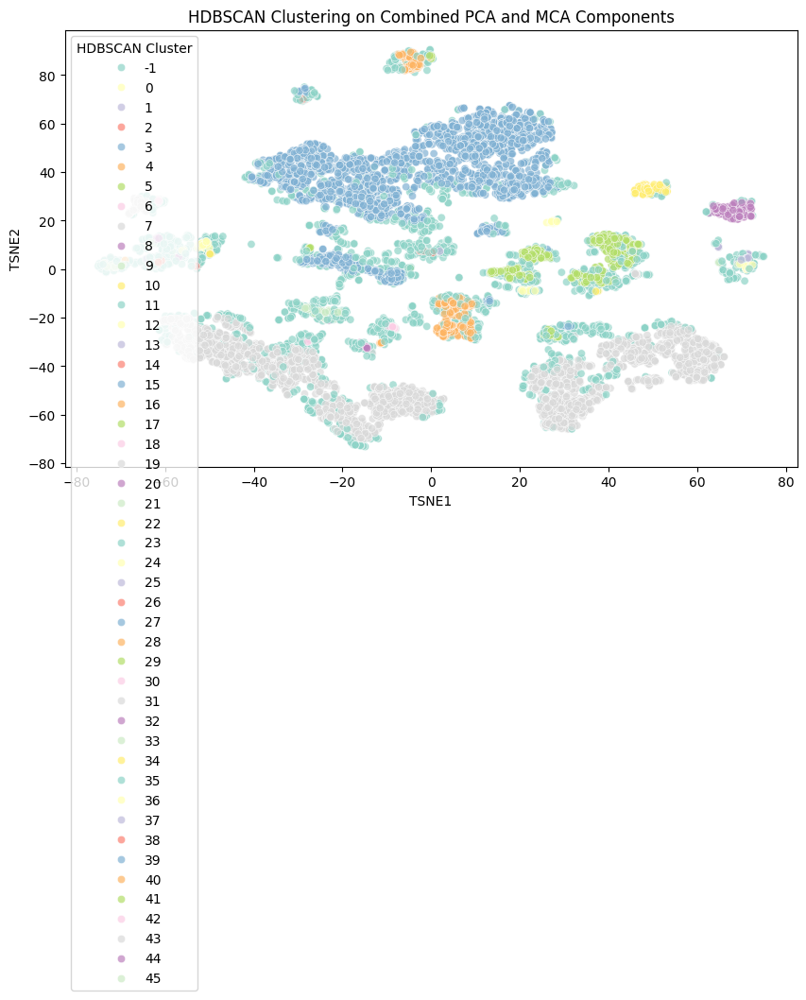

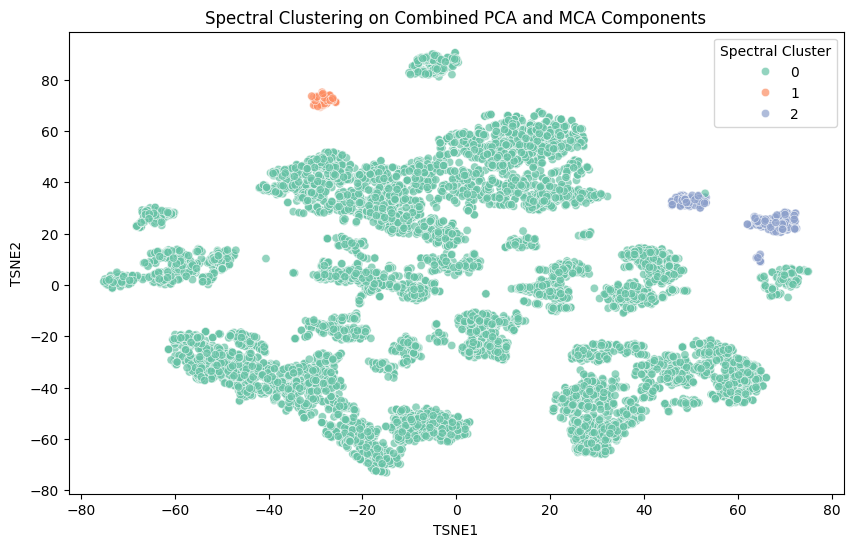

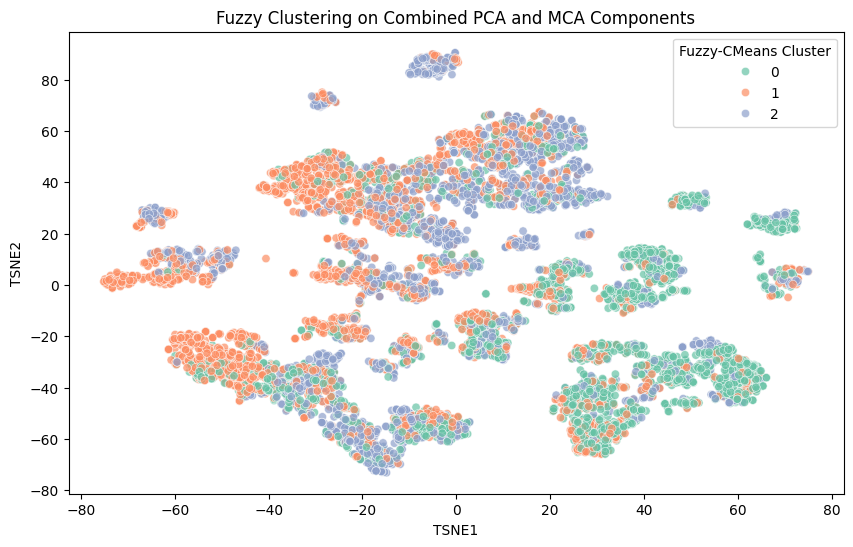

10 has the best K-Means Silhouette Score: 0.32
2 has the best GMM Silhouette Score: 0.26
DBSCAN Silhouette Score: 0.24
HDBSCAN Silhouette Score: -0.18
3 has the best Spectral Silhouette Score: 0.39
3 has the best CMeans Score: 0.17


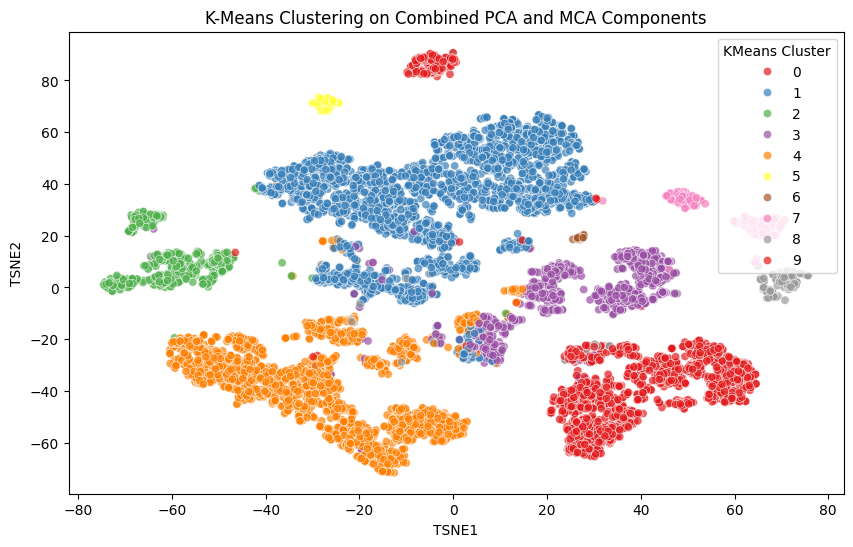

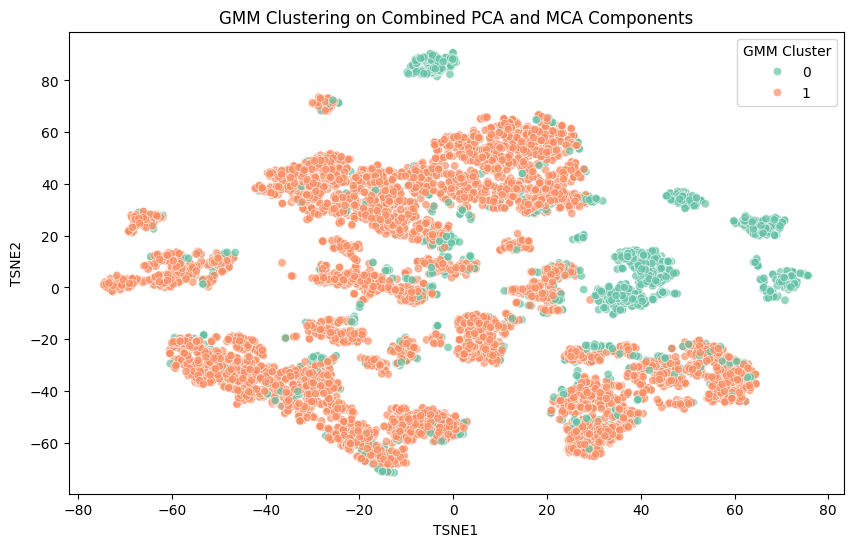

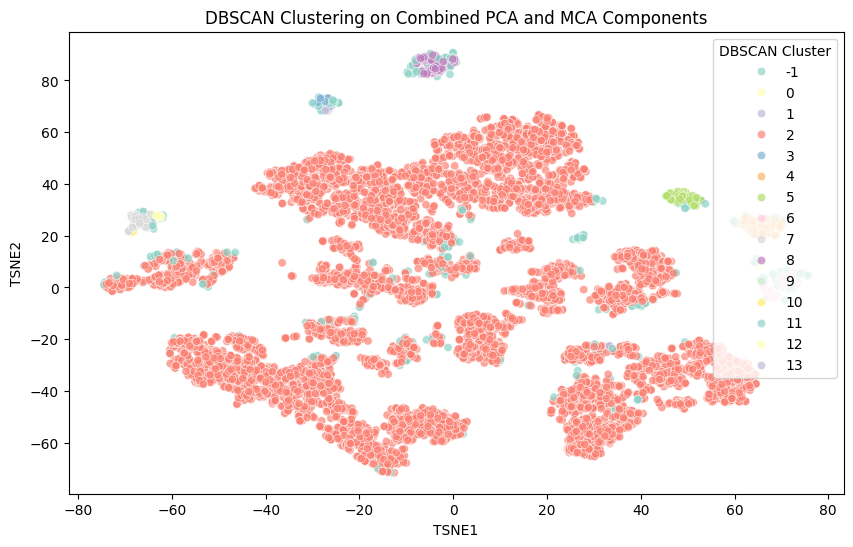

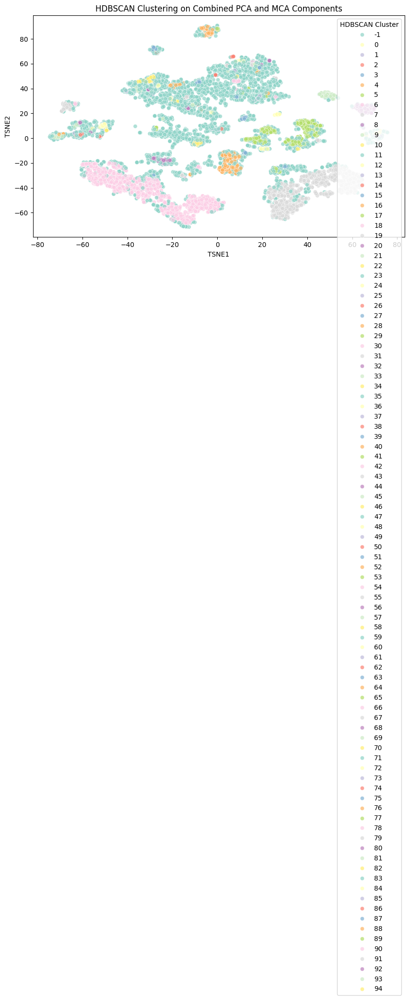

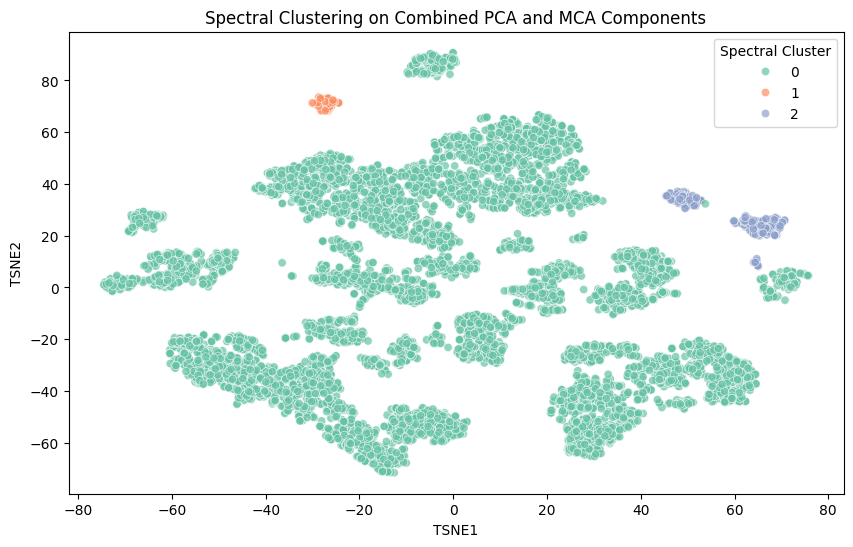

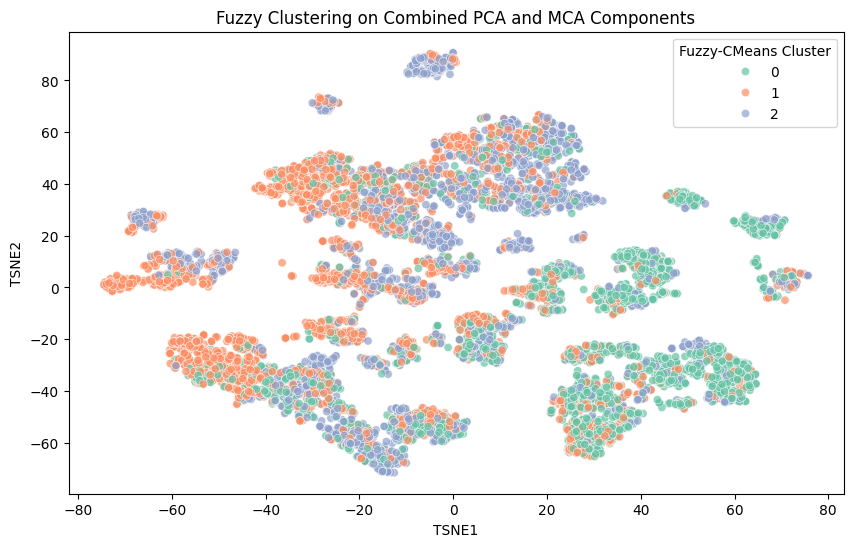

3 has the best K-Means Silhouette Score: 0.52
2 has the best GMM Silhouette Score: 0.27
DBSCAN Silhouette Score: -0.50
HDBSCAN Silhouette Score: 0.77
2 has the best Spectral Silhouette Score: 0.77
3 has the best CMeans Score: 0.17


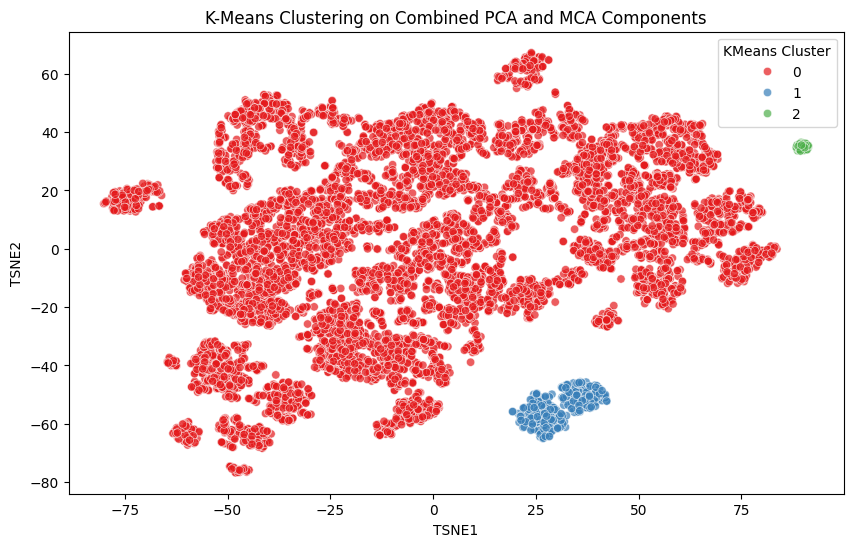

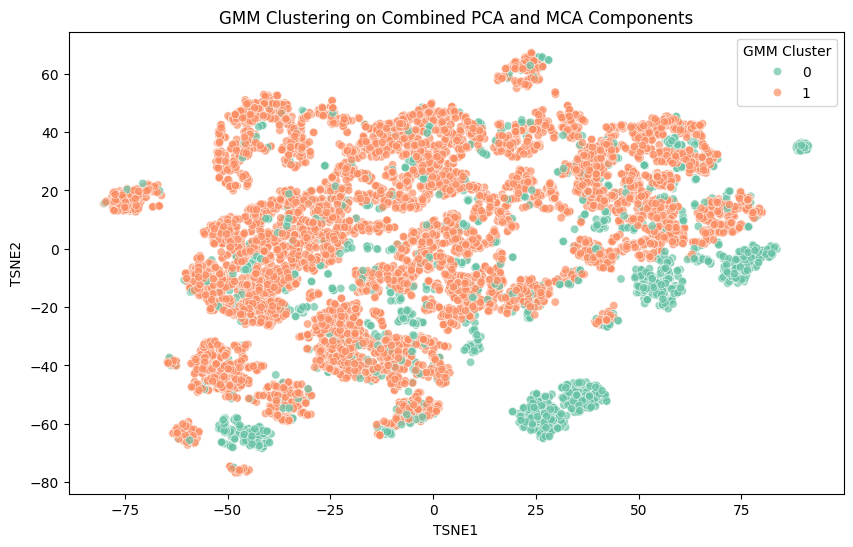

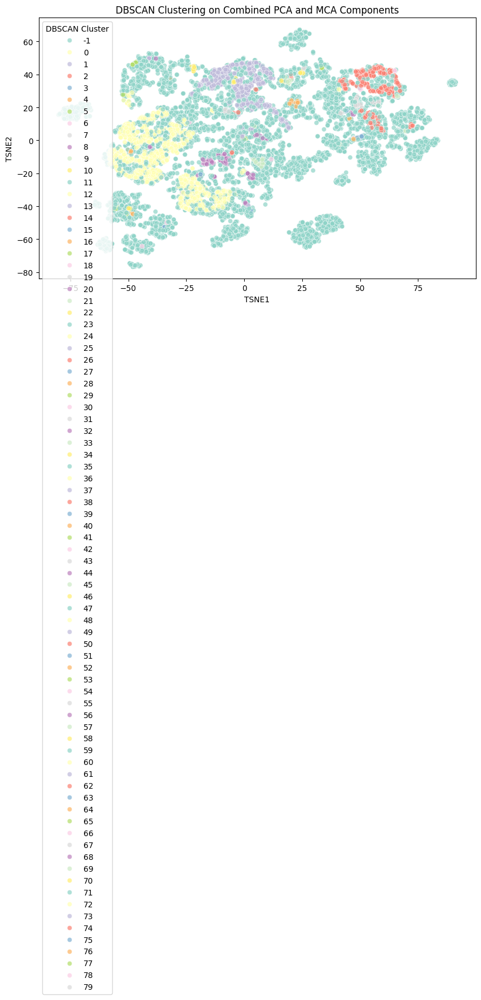

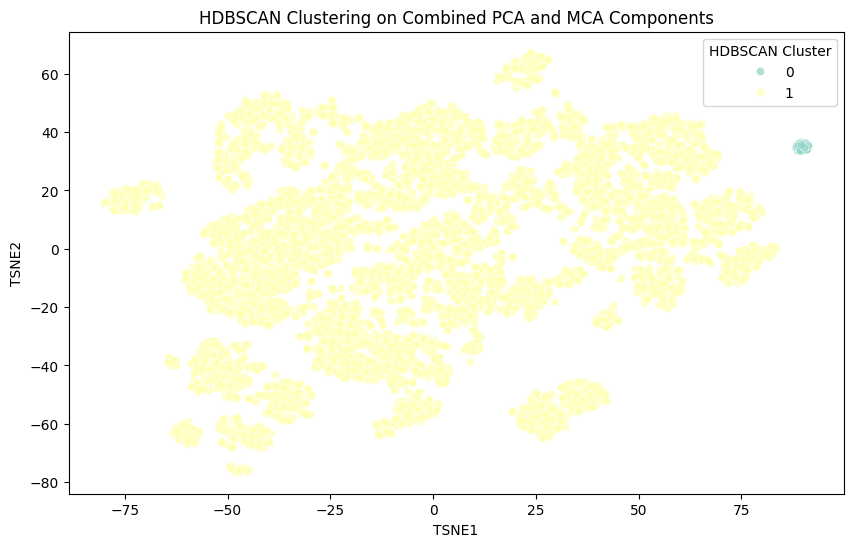

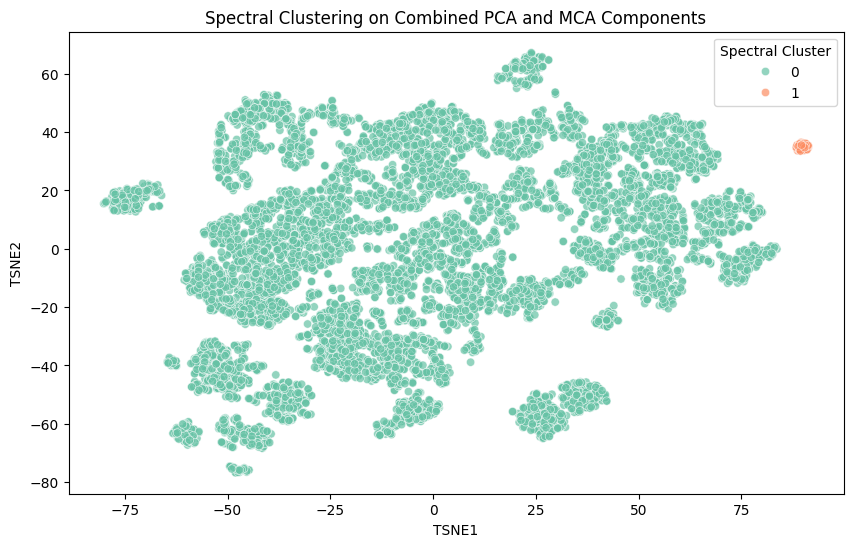

...

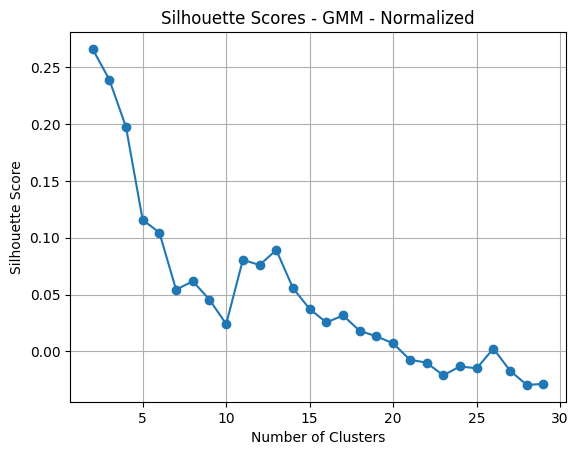

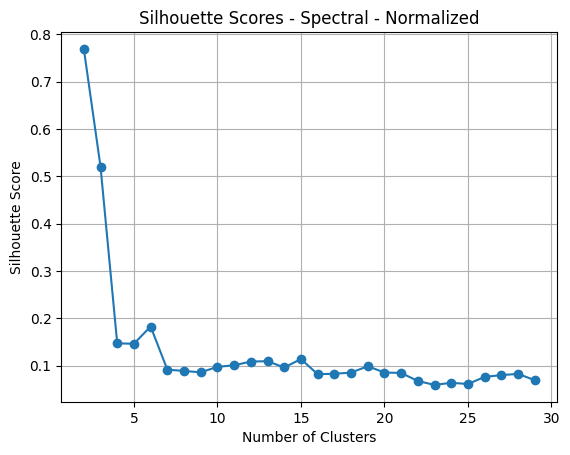

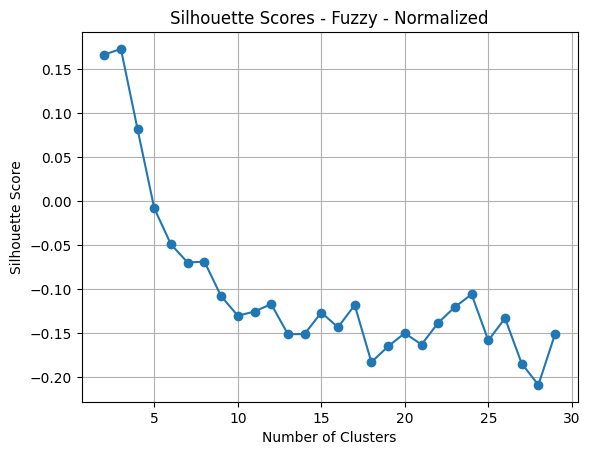

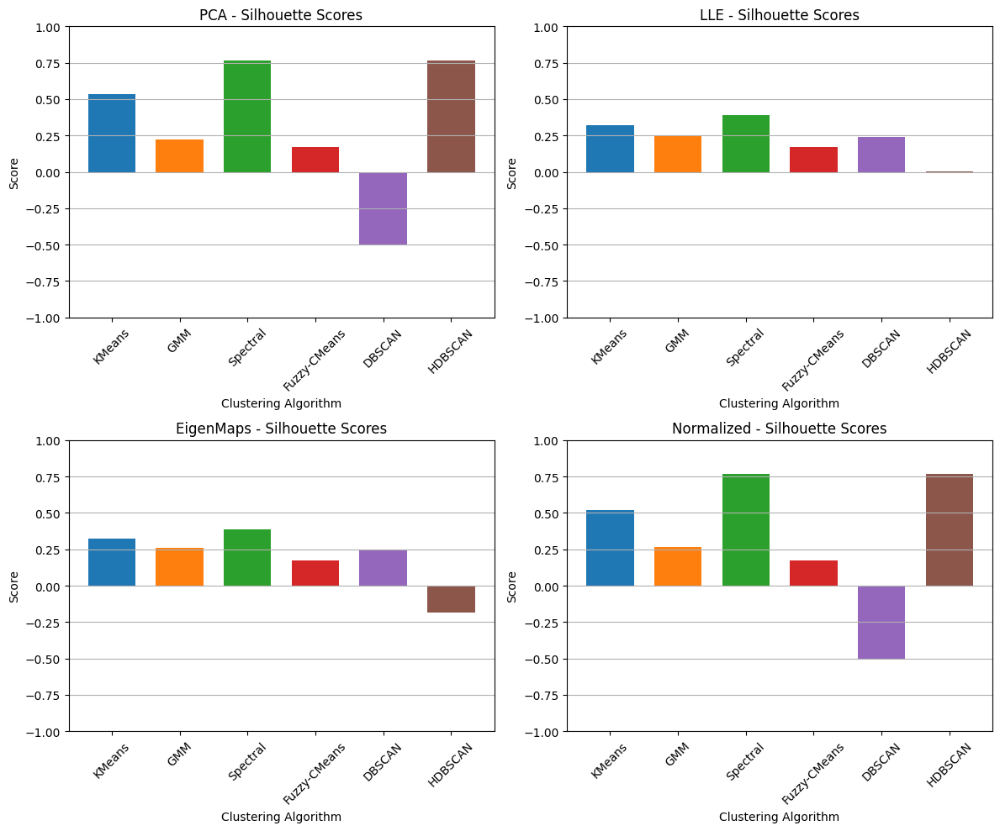

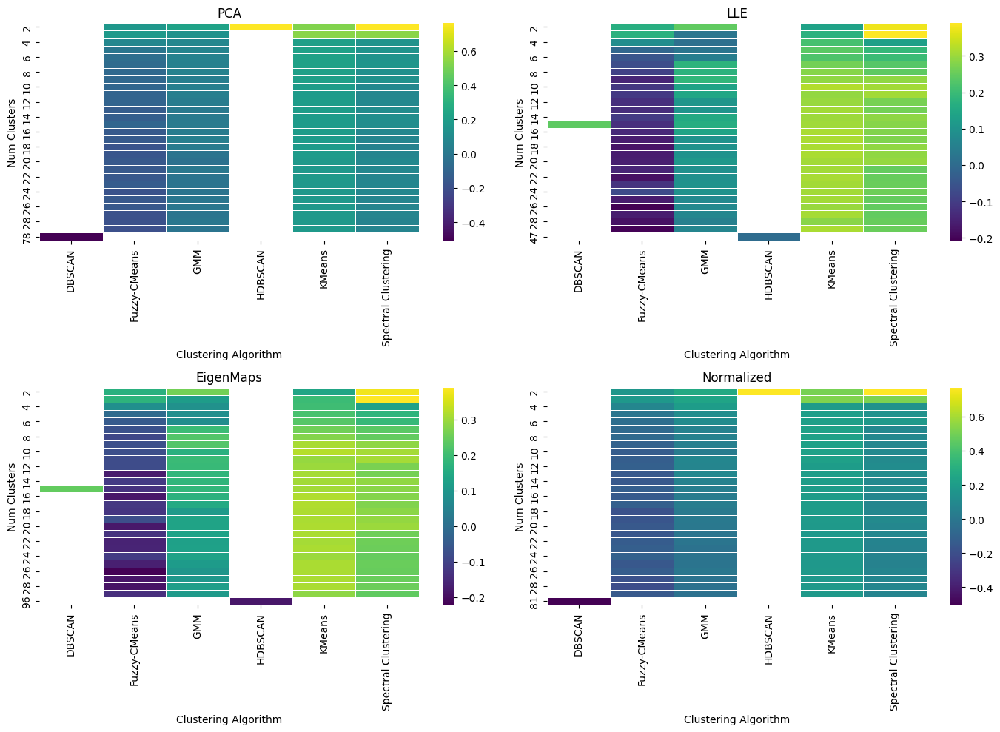

In [4]:
%run -i improved_algs.ipynb

# Prepering Labels

In [51]:
clusters_pca = {
    'kmeans': [best_kmeans_pca, kmeans_pca_score],
    'gmm':    [best_gmm_pca, gmm_pca_score],
    'dbscan': [dbscan_labels_pca, dbscan_silhouette_pca],
    'hdbscan': [hdbscan_labels_pca, hdbscan_silhouette_pca],
    'spectral': [best_spec_pca, spec_pca_score],
    'fuzzy': [best_fuzzy_pca, fuzzy_pca_score]
}

clusters_lle = {
    'kmeans': [best_kmeans_lle, kmeans_lle_score],
    'gmm':    [best_gmm_lle, gmm_lle_score],
    'dbscan': [dbscan_labels_lle, dbscan_silhouette_lle],
    'hdbscan': [hdbscan_labels_lle, hdbscan_silhouette_lle],
    'spectral': [best_spec_lle, spec_lle_score],
    'fuzzy': [best_fuzzy_lle, fuzzy_lle_score]
}

clusters_eigen = {
    'kmeans': [best_kmeans_eigen, kmeans_eigen_score],
    'gmm':    [best_gmm_eigen, gmm_eigen_score],
    'dbscan': [dbscan_labels_eigen, dbscan_silhouette_eigen],
    'hdbscan': [hdbscan_labels_eigen, hdbscan_silhouette_eigen],
    'spectral': [best_spec_eigen, spec_eigen_score],
    'fuzzy': [best_fuzzy_eigen, fuzzy_eigen_score]
}


clusters_normalized = {
    'kmeans': [best_kmeans, kmeans_score],
    'gmm':    [best_gmm, gmm_score],
    'dbscan': [dbscan_labels, dbscan_silhouette],
    'hdbscan': [hdbscan_labels, hdbscan_silhouette],
    'spectral': [best_spec, spec_score],
    'fuzzy': [best_fuzzy, fuzzy_score]
}


In [52]:
# 1 = earns >50K, 0 = earns <=50K
labels = (y_sample == ">50K").astype(int)

In [53]:
labels

28511    1
39994    0
6497     0
7821     0
29221    0
        ..
28096    0
19720    0
22630    1
41573    1
11444    0
Name: income, Length: 10000, dtype: int64

# Chi-Squared

Hypothesis H0 - Each cluster has the same rate of high income as the global rate

In [72]:
import numpy as np
import pandas as pd
from scipy.stats import chisquare

def evaluate_clusters(clusters_dict, labels):
    """
    Evaluate clustering results by Chi-Square test against ground truth labels (>50K, <50K).
    
    Args:
        clusters_dict (dict): {algorithm_name: cluster_assignments (np.array)}
        labels (pd.Series): Ground truth labels (0/1), aligned with clustering.

    Returns:
        pd.DataFrame: Table with Chi2 statistic, p-value, Cramer's V per algorithm.
    """
    alpha = 0.05  # 95% significance level
    
    chi2_results = []

    for algo, (clusters, score) in clusters_dict.items():
        clusters = np.array(clusters)

        # Filter out noise points (-1) if exist
        mask = clusters != -1
        clean_clusters = clusters[mask]
        clean_labels = labels.iloc[mask]

        K = len(np.unique(clean_clusters))  # number of clusters (after noise removal)

        # If only 1 cluster (bad clustering), skip
        if K <= 1:
            chi2_results.append({
                'algorithm': algo,
                'K': K,
                'chi2': np.nan,
                'chi2_p': np.nan,
                'cramer_v': np.nan
            })
            continue

        df = pd.DataFrame({
            'label': clean_labels.values,
            'cluster': clean_clusters
        })

        # --- Chi-Square Test ---
        obs = df.groupby('cluster')['label'].sum().sort_index().values    # observed >50K per cluster
        n_k = df['cluster'].value_counts().sort_index().values            # cluster sizes
        p_global = df['label'].mean()                                     # global proportion >50K
        exp = n_k * p_global                                              # expected >50K if random

        chi2_stat, p_chi2 = chisquare(f_obs=obs, f_exp=exp)

        # --- Cramer's V (effect size) ---
        N = len(df)
        cramer_v = np.sqrt(chi2_stat / (N * (K - 1)))

        chi2_results.append({
            'algorithm': algo,
            'K': K,
            'chi2': chi2_stat,
            'chi2_p': p_chi2,
            'cramer_v': cramer_v,
            'silhouette': score
        })

    # Collect all results
    chi2_df = pd.DataFrame(chi2_results)
    return chi2_df


In [73]:
chi2_pca = evaluate_clusters(clusters_pca, labels)
chi2_lle = evaluate_clusters(clusters_lle, labels)
chi2_eigen = evaluate_clusters(clusters_eigen, labels)
chi2_normalized = evaluate_clusters(clusters_normalized, labels)


In [74]:
chi2_pca

,algorithm,K,chi2,chi2_p,cramer_v,silhouette
0,kmeans,3,111.844158,5.168324e-25,0.074781,0.536457
1,gmm,2,321.556023,6.636945e-72,0.179320,0.222620
2,dbscan,77,247.104855,5.677039e-20,0.030549,-0.505921
3,hdbscan,2,50.461029,1.215547e-12,0.071036,0.762724
4,spectral,2,50.461029,1.215547e-12,0.071036,0.762724
5,fuzzy,3,317.699943,1.028807e-69,0.126036,0.173336


In [75]:
chi2_lle

,algorithm,K,chi2,chi2_p,cramer_v,silhouette
0,kmeans,10,470.104851,1.438627e-95,0.072273,0.321934
1,gmm,2,169.173492,1.121209e-38,0.130067,0.243449
2,dbscan,14,198.608624,2.637973e-35,0.039754,0.241654
3,hdbscan,46,462.094371,1.387291e-70,0.036319,0.002121
4,spectral,3,185.429501,5.426197e-41,0.096288,0.389712
5,fuzzy,3,316.404827,1.965915e-69,0.125779,0.173345


In [76]:
chi2_eigen

,algorithm,K,chi2,chi2_p,cramer_v,silhouette
0,kmeans,10,476.635973,5.762571e-97,0.072773,0.322753
1,gmm,2,172.853887,1.761484e-39,0.131474,0.259203
2,dbscan,14,203.752690,2.315798e-36,0.040255,0.242309
3,hdbscan,95,436.596971,1.419196e-45,0.028453,-0.184133
4,spectral,3,185.429501,5.426197e-41,0.096288,0.389817
5,fuzzy,3,316.404827,1.965915e-69,0.125779,0.173345


In [77]:
chi2_normalized

,algorithm,K,chi2,chi2_p,cramer_v,silhouette
0,kmeans,3,111.844158,5.168324e-25,0.074781,0.520710
1,gmm,2,296.575917,1.835599e-66,0.172214,0.266054
2,dbscan,80,248.341469,2.184753e-19,0.030813,-0.502393
3,hdbscan,2,50.461029,1.215547e-12,0.071036,0.768800
4,spectral,2,50.461029,1.215547e-12,0.071036,0.768800
5,fuzzy,3,317.699943,1.028807e-69,0.126036,0.173336


In [78]:
results_mixed = pd.DataFrame({
    "algorithm": ["kprototype_huang", "kprototype_cao", "dbscan", "hdbscan"],
    "chi2_p": [5.382714e-65, 7.264918e-28, 1.830572e-37, 5.948261e-48],
    "silhouette": [0.55, 0.54, 0.32, 0.08]
})
results_mixed

,algorithm,chi2_p,silhouette
0,kprototype_huang,5.382714e-65,0.55
1,kprototype_cao,7.264918e-28,0.54
2,dbscan,1.830572e-37,0.32
3,hdbscan,5.948261e-48,0.08


In [79]:
chi2_pca['source'] = 'pca'
chi2_lle['source'] = 'lle'
chi2_eigen['source'] = 'eigen'
chi2_normalized['source'] = 'normalized'
results_mixed['source'] = 'mixed'

common_columns = set(chi2_pca.columns) & set(chi2_lle.columns) & set(chi2_eigen.columns) & set(chi2_normalized.columns) & set(results_mixed.columns)

common_columns = ['source', 'algorithm'] + [col for col in common_columns if col not in {'source', 'algorithm'}]
common_columns = list(common_columns)

chi2_pca_common = chi2_pca[common_columns]
chi2_lle_common = chi2_lle[common_columns]
chi2_eigen_common = chi2_eigen[common_columns]
chi2_normalized_common = chi2_normalized[common_columns]
results_mixed_common = results_mixed[common_columns]

big_df = pd.concat([
    chi2_pca_common,
    chi2_lle_common,
    chi2_eigen_common,
    chi2_normalized_common,
    results_mixed_common
], ignore_index=True)

big_df = big_df.sort_values(by='source').reset_index(drop=True)

big_df


,source,algorithm,silhouette,chi2_p
0,eigen,gmm,0.259203,1.761484e-39
1,eigen,fuzzy,0.173345,1.965915e-69
2,eigen,spectral,0.389817,5.426197e-41
3,eigen,hdbscan,-0.184133,1.419196e-45
4,eigen,kmeans,0.322753,5.762571e-97
5,eigen,dbscan,0.242309,2.315798e-36
6,lle,kmeans,0.321934,1.438627e-95
7,lle,gmm,0.243449,1.121209e-38
8,lle,dbscan,0.241654,2.637973e-35
9,lle,hdbscan,0.002121,1.387291e-70


## Weights

In [80]:
big_df["score"] = ((-np.log10(big_df['chi2_p'])) / 100 + big_df["silhouette"]) / 2
big_df

,source,algorithm,silhouette,chi2_p,score
0,eigen,gmm,0.259203,1.761484e-39,0.323372
1,eigen,fuzzy,0.173345,1.965915e-69,0.430204
2,eigen,spectral,0.389817,5.426197e-41,0.396236
3,eigen,hdbscan,-0.184133,1.419196e-45,0.132173
4,eigen,kmeans,0.322753,5.762571e-97,0.642574
5,eigen,dbscan,0.242309,2.315798e-36,0.299331
6,lle,kmeans,0.321934,1.438627e-95,0.635177
7,lle,gmm,0.243449,1.121209e-38,0.311476
8,lle,dbscan,0.241654,2.637973e-35,0.293720
9,lle,hdbscan,0.002121,1.387291e-70,0.350350


In [70]:
big_df.iloc[big_df['weight'].idxmax()]

source           eigen
algorithm       kmeans
silhouette    0.322753
chi2_p             0.0
weight        0.642574
Name: 4, dtype: object

Turns out there is a dependency between the clusters and the labels because chi2_p values are extremely small. With that being said, Cramer's V values are very small as well, meaning that the coorelation between labels and clusters isn't strong. 

# MI

In [19]:
from sklearn.metrics import normalized_mutual_info_score, homogeneity_score, completeness_score, adjusted_rand_score

def clustering_quality(labels, clusters_dict):
    """
    Evaluate clustering quality against true labels.
    
    Parameters:
        labels (pd.Series or np.array): ground-truth labels (0 or 1)
        clusters_dict (dict): {algorithm_name: clusters_array}

    Returns:
        pd.DataFrame: table of metrics
    """
    results = []

    for algo, clusters in clusters_dict.items():
        nmi = normalized_mutual_info_score(labels, clusters)
        hom = homogeneity_score(labels, clusters)
        comp = completeness_score(labels, clusters)
        ari = adjusted_rand_score(labels, clusters)

        results.append({
            'algorithm': algo,
            'NMI': nmi,
            'Homogeneity': hom,
            'Completeness': comp,
            'ARI': ari
        })

    return pd.DataFrame(results)

In [20]:
quality_pca = clustering_quality(labels, clusters_pca)
quality_lle = clustering_quality(labels, clusters_lle)
quality_eigen = clustering_quality(labels, clusters_eigen)
quality_normalized = clustering_quality(labels, clusters_normalized)

In [21]:
quality_pca

,algorithm,NMI,Homogeneity,Completeness,ARI
0,kmeans,0.016592,0.011442,0.030168,0.050988
1,gmm,0.035950,0.035618,0.036289,0.111726
2,dbscan,0.018007,0.032110,0.012512,-0.029482
3,hdbscan,0.009249,0.004920,0.076960,0.014534
4,spectral,0.009249,0.004920,0.076960,0.014534
5,fuzzy,0.025983,0.038521,0.019603,0.025244


In [22]:
quality_lle

,algorithm,NMI,Homogeneity,Completeness,ARI
0,kmeans,0.025308,0.052646,0.016658,0.029440
1,gmm,0.019287,0.018971,0.019614,0.077136
2,dbscan,0.020355,0.020924,0.019816,0.028039
3,hdbscan,0.023624,0.057250,0.014883,0.023613
4,spectral,0.027488,0.018601,0.052637,0.053764
5,fuzzy,0.025874,0.038359,0.019520,0.025179


In [23]:
quality_eigen

,algorithm,NMI,Homogeneity,Completeness,ARI
0,kmeans,0.025673,0.053421,0.016896,0.029811
1,gmm,0.020408,0.019130,0.021869,0.083055
2,dbscan,0.021006,0.021585,0.020457,0.027878
3,hdbscan,0.026761,0.068698,0.016617,0.032071
4,spectral,0.027488,0.018601,0.052637,0.053764
5,fuzzy,0.025874,0.038359,0.019520,0.025179


In [24]:
quality_normalized

,algorithm,NMI,Homogeneity,Completeness,ARI
0,kmeans,0.016592,0.011442,0.030168,0.050988
1,gmm,0.035950,0.035618,0.036289,0.111726
2,dbscan,0.018007,0.032110,0.012512,-0.029482
3,hdbscan,0.009249,0.004920,0.076960,0.014534
4,spectral,0.009249,0.004920,0.076960,0.014534
5,fuzzy,0.025983,0.038521,0.019603,0.025244


In [30]:
import pandas as pd
import numpy as np

def cluster_income_distribution(labels, clusters):
    """
    labels: pd.Series or np.array with 0 (<=50k) and 1 (>50k)
    clusters: np.array with cluster assignment for each sample
    
    Returns a DataFrame with cluster ID, cluster size, and % high income
    """
    df = pd.DataFrame({'label': labels, 'cluster': clusters})
    
    summary = df.groupby('cluster').agg(
        cluster_size=('label', 'count'),
        num_high_income=('label', 'sum')
    )
    summary['percent_high_income'] = 100 * summary['num_high_income'] / summary['cluster_size']
    
    return summary.reset_index().sort_values(by='percent_high_income', ascending=False)

# Example usage:
summary = cluster_income_distribution(labels, clusters_eigen['kmeans'])  # or any algorithm/K you want
print(summary)


   cluster  cluster_size  num_high_income  percent_high_income
7        7           311              192            61.736334
3        3          1094              414            37.842779
0        0          1567              566            36.119974
8        8           236               61            25.847458
4        4          2335              464            19.871520
9        9           204               39            19.117647
1        1          3447              633            18.363795
5        5            98               13            13.265306
2        2           668               74            11.077844
6        6            40                2             5.000000


In [42]:
X_sample[X_sample["capital-gain"] != 0]["capital-gain"]

19743     7688
19120     3103
26623     4064
18102     4416
6016      9386
         ...  
40644    15024
3384     15024
12668     7298
24850    99999
22980     6849
Name: capital-gain, Length: 859, dtype: int64

In [44]:
import pandas as pd
import numpy as np

def cluster_income_distribution(labels, clusters):
    """
    labels: pd.Series or np.array with 0 (<=50k) and 1 (>50k)
    clusters: np.array with cluster assignment for each sample
    
    Returns a DataFrame with cluster ID, cluster size, and % high income
    """
    df = pd.DataFrame({'label': X_sample["capital-gain"], 'cluster': clusters})
    
    summary = df.groupby('cluster').agg(
        cluster_size=('label', 'count'),
        num_high_income=('label', 'sum')
    )
    summary['avg_capital_gain'] = summary['num_high_income'] / summary['cluster_size']
    
    return summary.reset_index().sort_values(by='percent_high_income', ascending=False)

# Example usage:
summary = cluster_income_distribution(labels, clusters_lle['kmeans'])  # or any algorithm/K you want
print(summary)

   cluster  cluster_size  num_high_income  percent_high_income
5        5           311          3663523         11779.816720
0        0          1062          2145613          2020.351224
4        4          1567          2455155          1566.786854
6        6           246           286566          1164.902439
2        2           204           129480           634.705882
1        1          3457          1806869           522.669656
7        7          2348          1223289           520.991908
3        3           667           130992           196.389805
8        8            40             3781            94.525000
9        9            98             5178            52.836735


In [45]:
import pandas as pd
import numpy as np

def cluster_income_distribution(labels, clusters):
    """
    labels: pd.Series or np.array with 0 (<=50k) and 1 (>50k)
    clusters: np.array with cluster assignment for each sample
    
    Returns a DataFrame with cluster ID, cluster size, and % high income
    """
    df = pd.DataFrame({'label': X_sample["capital-loss"], 'cluster': clusters})
    
    summary = df.groupby('cluster').agg(
        cluster_size=('label', 'count'),
        num_high_income=('label', 'sum')
    )
    summary['percent_high_income'] = summary['num_high_income'] / summary['cluster_size']
    
    return summary.reset_index().sort_values(by='percent_high_income', ascending=False)

# Example usage:
summary = cluster_income_distribution(labels, clusters_lle['kmeans'])  # or any algorithm/K you want
print(summary)

   cluster  cluster_size  num_high_income  percent_high_income
5        5           311            55333           177.919614
0        0          1062           137781           129.737288
4        4          1567           189984           121.240587
2        2           204            20506           100.519608
9        9            98             9124            93.102041
8        8            40             3337            83.425000
6        6           246            17324            70.422764
7        7          2348           156569            66.681857
1        1          3457           208886            60.424067
3        3           667            20900            31.334333


In [48]:
import pandas as pd
import numpy as np

def cluster_income_distribution(labels, clusters):
    """
    labels: pd.Series or np.array with 0 (<=50k) and 1 (>50k)
    clusters: np.array with cluster assignment for each sample
    
    Returns a DataFrame with cluster ID, cluster size, and % high income
    """
    df = pd.DataFrame({'label': X_sample["education"], 'cluster': clusters})
    
    summary = df.groupby('cluster').agg(
        cluster_size=('label', 'count'),
        num_high_income=('label', 'sum')
    )
    summary['percent_high_income'] = summary['num_high_income'] / summary['cluster_size']
    
    return summary.reset_index().sort_values(by='percent_high_income', ascending=False)

summary = cluster_income_distribution(labels, clusters_lle['kmeans'])  # or any algorithm/K you want
print(summary)

TypeError: unsupported operand type(s) for /: 'str' and 'int'